# A notebook for creating sc graph animations with glimpses

In [166]:
import napari
from cellpose import models
from octopuslite import utils, tile
import numpy as np
import os

def view(img):
    return napari.Viewer().add_image(img)
from napari_animation import Animation
from tqdm.auto import tqdm

import btrack
import dask.array as da

from pathlib import Path
import cv2

from skimage.transform import rescale, resize, downscale_local_mean
from skimage.io import imsave, imread
from scipy.ndimage.filters import gaussian_filter1d

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme(style="ticks")
sns.set_palette("rocket_r")

def msd_calc(x1, y1, x2, y2):
    """
    Displacement calculation for cell movement between frames
    """
    return np.sqrt((x1-x2)**2+(y1-y2)**2)

def update_slider(event):
    # only trigger if update comes from first axis (optional)
        #ind_lambda = viewer.dims.indices[0]
    time = viewer.dims.current_step[0]
    viewer.text_overlay.text = f"{time:1.1f} hours \n cyan:"
text_size = 25
napari_scale = [1.4949402023919043e-07, 1.4949402023919043e-07]

import glob
from natsort import natsorted

### glimpse size
size = 500
### resized images are to this scale
scale = 6048/1200

/tmp/ipykernel_24055/2017510086.py:20: DeprecationWarning: Please use `gaussian_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter1d


### Load all metadata

Both the image metadata and the assay layout metadata

In [2]:
image_dir = '/mnt/DATA/sandbox/pierre_live_cell_data/outputs/Replication_IPSDM_GFP/Images/'
image_metadata_fn = '/mnt/DATA/sandbox/pierre_live_cell_data/outputs/Replication_IPSDM_GFP/Index.idx.xml'
metadata = utils.read_harmony_metadata(image_metadata_fn)
assay_layout_metadata = '/mnt/DATA/sandbox/pierre_live_cell_data/outputs/Replication_IPSDM_GFP/Assaylayout/20210602_Live_cell_IPSDMGFP_ATB.xml'
assay_layout = utils.read_harmony_metadata(assay_layout_metadata, assay_layout=True)
assay_layout

Reading metadata XML file...


Extracting HarmonyV5 metadata:   0%|          | 0/113400 [00:00<?, ?it/s]

Extracting metadata complete!
Reading metadata XML file...
Extracting metadata complete!


Strain Compound Concentration ConcentrationEC
3 4    RD1     CTRL             0             EC0
  5     WT     CTRL             0             EC0
  6     WT      PZA            60            EC50
  7     WT      RIF           0.1            EC50
  8     WT      INH          0.04            EC50
  9     WT      BDQ          0.02            EC50
4 4    RD1     CTRL             0             EC0
  5     WT     CTRL             0             EC0
  6     WT      PZA            60            EC50
  7     WT      RIF           0.1            EC50
  8     WT      INH          0.04            EC50
  9     WT      BDQ          0.02            EC50
5 4    RD1     CTRL             0             EC0
  5     WT     CTRL             0             EC0
  6     WT      PZA           400            EC99
  7     WT      RIF             2            EC99
  8     WT      INH             2            EC99
  9     WT      BDQ           2.5            EC99
6 4    RD1     CTRL             0             EC0
  5     WT     CTRL             0             EC0
  6     WT      PZA           400            EC99
  7     WT      RIF             2            EC99
  8     WT      INH             2            EC99
  9     WT      BDQ           2.5            EC99

# Iteratively load all tracks

and append to a track_dict dictionary

In [3]:
tracks_dict = dict()
segmentation_dict = dict()
### iterate over all experimental conditions
for (row, column), info in tqdm(assay_layout.iterrows(), 
                                desc = 'Progress through positions',
                                total = len(assay_layout)):
    ### load tracks
    with btrack.dataio.HDF5FileHandler(
            f'/mnt/DATA/macrohet/segmentation/full_localisation/({row},{column}).h5',#
            'r', 
            obj_type = 'obj_type_1', 
            ) as hdf: 
            tracks = hdf.tracks
            seg = hdf.segmentation
            
    tracks_dict[(row, column)] = tracks
    segmentation_dict[(row, column)] = seg


Progress through positions:   0%|          | 0/24 [00:00<?, ?it/s]

[INFO][2023/03/07 10:29:23 AM] Opening HDF file: /mnt/DATA/macrohet/segmentation/full_localisation/(3,4).h5...
[INFO][2023/03/07 10:29:23 AM] Loading tracks/obj_type_1
[INFO][2023/03/07 10:29:23 AM] Loading LBEP/obj_type_1
[INFO][2023/03/07 10:29:23 AM] Loading objects/obj_type_1 (25554, 5) (25554 filtered: None)
[INFO][2023/03/07 10:29:24 AM] Loading segmentation (75, 1200, 1200)
[INFO][2023/03/07 10:29:24 AM] Closing HDF file: /mnt/DATA/macrohet/segmentation/full_localisation/(3,4).h5
[INFO][2023/03/07 10:29:24 AM] Opening HDF file: /mnt/DATA/macrohet/segmentation/full_localisation/(3,5).h5...
[INFO][2023/03/07 10:29:24 AM] Loading tracks/obj_type_1
[INFO][2023/03/07 10:29:24 AM] Loading LBEP/obj_type_1
[INFO][2023/03/07 10:29:24 AM] Loading objects/obj_type_1 (26917, 5) (26917 filtered: None)
[INFO][2023/03/07 10:29:25 AM] Loading segmentation (75, 1200, 1200)
[INFO][2023/03/07 10:29:25 AM] Closing HDF file: /mnt/DATA/macrohet/segmentation/full_localisation/(3,5).h5
[INFO][2023/03/0

[INFO][2023/03/07 10:29:41 AM] Closing HDF file: /mnt/DATA/macrohet/segmentation/full_localisation/(5,8).h5
[INFO][2023/03/07 10:29:41 AM] Opening HDF file: /mnt/DATA/macrohet/segmentation/full_localisation/(5,9).h5...
[INFO][2023/03/07 10:29:41 AM] Loading tracks/obj_type_1
[INFO][2023/03/07 10:29:41 AM] Loading LBEP/obj_type_1
[INFO][2023/03/07 10:29:41 AM] Loading objects/obj_type_1 (22122, 5) (22122 filtered: None)
[INFO][2023/03/07 10:29:42 AM] Loading segmentation (75, 1200, 1200)
[INFO][2023/03/07 10:29:42 AM] Closing HDF file: /mnt/DATA/macrohet/segmentation/full_localisation/(5,9).h5
[INFO][2023/03/07 10:29:42 AM] Opening HDF file: /mnt/DATA/macrohet/segmentation/full_localisation/(6,4).h5...
[INFO][2023/03/07 10:29:42 AM] Loading tracks/obj_type_1
[INFO][2023/03/07 10:29:42 AM] Loading LBEP/obj_type_1
[INFO][2023/03/07 10:29:42 AM] Loading objects/obj_type_1 (24744, 5) (24744 filtered: None)
[INFO][2023/03/07 10:29:43 AM] Loading segmentation (75, 1200, 1200)
[INFO][2023/03/0

# Compile all full length tracks into dataframe

Add extra information such as the MSD of cells between frames

In [4]:
### list of track info dfs
dfs = list()
### empty dictionary for filtered tracks
filtered_tracks = dict()
### iterate over all tracks
for key in tracks_dict.keys():
    ### extract tracks only with max length
    filtered_tracks[key] = [track for track in tracks_dict[key] if len(track) == 75]
    ### iterate over full length tracks
    for track in filtered_tracks[key]:
        ### get info for assay layout
        info = assay_layout.loc[key]
        ### compile single track dictionary of info
        d = {'Time (hours)':track['t'], 
             'x':track['x'],
             'y':track['y'],
             'Area':track['area'], 
             'Intracellular Mtb content':track['mean_intensity-1'],
             'Mean Mtb content':[np.nanmean(track['mean_intensity-1']) for i in range(len(track['t']))],
             'Macroph. GFP expression':track['mean_intensity-0'],
             'Eccentricity':np.sqrt(1-((track['minor_axis_length']**2)/(track['major_axis_length']**2))),
             'MSD': [msd_calc(track['x'][i-1], 
                              track['y'][i-1], 
                              track['x'][i], 
                              track['y'][i]) 
                              if i != 0 else 0
                              for i in range(0, len(track))],
             'Strain':[info['Strain'] for i in range(len(track['t']))], 
             'Compound':[info['Compound'] for i in range(len(track['t']))], 
             'Concentration':[info['ConcentrationEC'] for i in range(len(track['t']))], 
             'Cell ID':[track.ID for i in range(len(track['t']))],
             'Acquisition ID':[key for i in range(len(track['t']))]}
        ### append df to list of dfs
        dfs.append(pd.DataFrame(d))
### concat single track dfs into big df
df = pd.concat(dfs, ignore_index=True)
### interpolate missing values as sometimes segmentation drops result in NaN
df.interpolate(inplace=True)

In [5]:
df

,Time (hours),x,y,Area,Intracellular Mtb content,Mean Mtb content,Macroph. GFP expression,Eccentricity,MSD,Strain,Compound,Concentration,Cell ID,Acquisition ID
0,0,1169.847412,13.893421,760.0,0.005136,0.005272,0.014705,0.809516,0.000000,RD1,CTRL,EC0,343,"(3, 4)"
1,1,1172.826538,14.674929,1049.0,0.005121,0.005272,0.013235,0.843927,3.079926,RD1,CTRL,EC0,343,"(3, 4)"
2,2,1174.588867,14.375803,934.0,0.005116,0.005272,0.013899,0.719524,1.787535,RD1,CTRL,EC0,343,"(3, 4)"
3,3,1175.250610,12.160207,774.0,0.005094,0.005272,0.013428,0.739700,2.312308,RD1,CTRL,EC0,343,"(3, 4)"
4,4,1180.553955,9.897770,538.0,0.005071,0.005272,0.012774,0.761300,5.765768,RD1,CTRL,EC0,343,"(3, 4)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81520,70,559.663025,1177.240234,3018.0,0.005635,0.005657,0.024949,0.698306,3.245095,WT,BDQ,EC99,155,"(6, 9)"
81521,71,556.457581,1178.115601,2863.0,0.005609,0.005657,0.024090,0.716728,3.322821,WT,BDQ,EC99,155,"(6, 9)"
81522,72,559.905823,1178.514648,3047.0,0.005600,0.005657,0.022092,0.789115,3.471255,WT,BDQ,EC99,155,"(6, 9)"
81523,73,565.014221,1180.512939,2737.0,0.005606,0.005657,0.021206,0.822009,5.485335,WT,BDQ,EC99,155,"(6, 9)"


In [6]:
df

,Time (hours),x,y,Area,Intracellular Mtb content,Mean Mtb content,Macroph. GFP expression,Eccentricity,MSD,Strain,Compound,Concentration,Cell ID,Acquisition ID
0,0,1169.847412,13.893421,760.0,0.005136,0.005272,0.014705,0.809516,0.000000,RD1,CTRL,EC0,343,"(3, 4)"
1,1,1172.826538,14.674929,1049.0,0.005121,0.005272,0.013235,0.843927,3.079926,RD1,CTRL,EC0,343,"(3, 4)"
2,2,1174.588867,14.375803,934.0,0.005116,0.005272,0.013899,0.719524,1.787535,RD1,CTRL,EC0,343,"(3, 4)"
3,3,1175.250610,12.160207,774.0,0.005094,0.005272,0.013428,0.739700,2.312308,RD1,CTRL,EC0,343,"(3, 4)"
4,4,1180.553955,9.897770,538.0,0.005071,0.005272,0.012774,0.761300,5.765768,RD1,CTRL,EC0,343,"(3, 4)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81520,70,559.663025,1177.240234,3018.0,0.005635,0.005657,0.024949,0.698306,3.245095,WT,BDQ,EC99,155,"(6, 9)"
81521,71,556.457581,1178.115601,2863.0,0.005609,0.005657,0.024090,0.716728,3.322821,WT,BDQ,EC99,155,"(6, 9)"
81522,72,559.905823,1178.514648,3047.0,0.005600,0.005657,0.022092,0.789115,3.471255,WT,BDQ,EC99,155,"(6, 9)"
81523,73,565.014221,1180.512939,2737.0,0.005606,0.005657,0.021206,0.822009,5.485335,WT,BDQ,EC99,155,"(6, 9)"


### Add category to discern initial amount of Mtb growth

Categorical

In [7]:
initial_mtb = df.loc[df['Time (hours)'] == 0, 'Intracellular Mtb content']
initial_mtb_quartiles = pd.cut(initial_mtb, bins = [initial_mtb.quantile(.0), 
                                                    initial_mtb.quantile(.25), 
                                                    initial_mtb.quantile(0.5), 
                                                    initial_mtb.quantile(.75),
                                                    initial_mtb.quantile(1)], 
                                                    labels = ['Lower', 'Lower-mid', 'Upper-mid', 'Upper'])
df['Initial Mtb load (quartile)'] = initial_mtb_quartiles
df.fillna(method='ffill', inplace=True)

In [8]:
final_mtb = df.loc[df['Time (hours)'] == 74, 'Intracellular Mtb content']
final_mtb_quartiles = pd.cut(final_mtb, bins = [final_mtb.quantile(.0), 
                                                    final_mtb.quantile(.25), 
                                                    final_mtb.quantile(0.5), 
                                                    final_mtb.quantile(.75),
                                                    final_mtb.quantile(1)], 
                                                    labels = ['Lower', 'Lower-mid', 'Upper-mid', 'Upper'])
df['Final Mtb load (quartile)'] = final_mtb_quartiles
df.fillna(method='bfill', inplace=True)

Now continuous assessment: ie. the actual value of the Mtb content in the first frame

In [9]:
initial_mtb = df.loc[df['Time (hours)'] == 0, 'Intracellular Mtb content']
df['Initial Mtb load'] = initial_mtb
df.fillna(method='ffill', inplace=True)

In [10]:
final_mtb = df.loc[df['Time (hours)'] == 74, 'Intracellular Mtb content']
df['Final Mtb load'] = final_mtb
df.fillna(method='bfill', inplace=True)

## Pick a single experiment to focus on?

In [11]:
### select from conditions
selected_expt_df = df[(df['Compound'] == 'PZA') & (df['Concentration'] == 'EC50')]
acq_ID = selected_expt_df['Acquisition ID'].iloc[0]

In [29]:
### get extreme cells
extreme_cases = pd.concat([selected_expt_df[(selected_expt_df['Mean Mtb content'] == np.max(selected_expt_df['Mean Mtb content']))],
                           selected_expt_df[(selected_expt_df['Mean Mtb content'] == np.min(selected_expt_df['Mean Mtb content']))]])
extreme_cases

,Time (hours),x,y,Area,Intracellular Mtb content,Mean Mtb content,Macroph. GFP expression,Eccentricity,MSD,Strain,Compound,Concentration,Cell ID,Acquisition ID,Initial Mtb load (quartile),Final Mtb load (quartile),Initial Mtb load,Final Mtb load
15300,0,268.956024,65.425865,2637.0,0.006256,0.007892,0.016216,0.829670,0.000000,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684
15301,1,272.280609,60.727016,3535.0,0.005994,0.007892,0.014438,0.729552,5.756044,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684
15302,2,279.796692,46.732731,3330.0,0.005973,0.007892,0.013204,0.683020,15.884947,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684
15303,3,279.816193,53.272476,3237.0,0.005982,0.007892,0.013640,0.807284,6.539774,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684
15304,4,279.036102,52.219032,3657.0,0.005994,0.007892,0.013985,0.625249,1.310834,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17395,70,437.507751,677.482788,1160.0,0.005289,0.005293,0.019831,0.576796,5.990601,WT,INH,EC50,81,"(3, 8)",Lower,Lower,0.005292,0.005288
17396,71,435.135040,678.725037,1022.0,0.005291,0.005293,0.020450,0.603804,2.678234,WT,INH,EC50,81,"(3, 8)",Lower,Lower,0.005292,0.005288
17397,72,439.116241,679.119019,1084.0,0.005295,0.005293,0.021352,0.524047,4.000648,WT,INH,EC50,81,"(3, 8)",Lower,Lower,0.005292,0.005288
17398,73,440.520416,680.639954,1159.5,0.005292,0.005293,0.019682,0.627327,2.070012,WT,INH,EC50,81,"(3, 8)",Lower,Lower,0.005292,0.005288


In [33]:
### isolate a single cell ID from df of interesting cells
ID = 300
### isolate sc df
sc_df = extreme_cases[extreme_cases['Cell ID']==ID]

In [24]:
### or manually select from acquisition ID and Cell ID 
acq_ID = (3, 8)
selected_expt_df = df[(df['Acquisition ID'] == acq_ID)]
### get cell ID
ID = 300
### isolate sc df
sc_df = extreme_cases[extreme_cases['Cell ID']==ID]

# First assess glimpse with scale bars etc

In [393]:
sc_df

,Time (hours),x,y,Area,Intracellular Mtb content,Mean Mtb content,Macroph. GFP expression,Eccentricity,MSD,Strain,Compound,Concentration,Cell ID,Acquisition ID,Initial Mtb load (quartile),Final Mtb load (quartile),Initial Mtb load,Final Mtb load
15300,0,268.956024,65.425865,2637.0,0.006256,0.007892,0.016216,0.829670,0.000000,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684
15301,1,272.280609,60.727016,3535.0,0.005994,0.007892,0.014438,0.729552,5.756044,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684
15302,2,279.796692,46.732731,3330.0,0.005973,0.007892,0.013204,0.683020,15.884947,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684
15303,3,279.816193,53.272476,3237.0,0.005982,0.007892,0.013640,0.807284,6.539774,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684
15304,4,279.036102,52.219032,3657.0,0.005994,0.007892,0.013985,0.625249,1.310834,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15370,70,248.347244,94.681091,1941.0,0.010731,0.007892,0.020725,0.881303,3.032536,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684
15371,71,249.660538,94.331650,2177.0,0.010051,0.007892,0.019120,0.912106,1.358988,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684
15372,72,250.355911,92.719231,2023.0,0.010426,0.007892,0.019122,0.873205,1.755973,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684
15373,73,250.366959,93.389526,2349.0,0.009934,0.007892,0.018927,0.920033,0.670387,WT,INH,EC50,300,"(3, 8)",Upper,Upper,0.006256,0.010684


In [457]:
### make glimpse stack of masks
print(f'Creating mask glimpse ID: {acq_ID, ID}')
### get mask images
masks = segmentation_dict[acq_ID]
### create empty list for stack of images
mask_glimpse_stack = list()
coords_stack = list()
### iterate over time points from single cell 
for row in tqdm(sc_df.iterrows(), total = len(sc_df), desc = f'Creating mask glimpse ID: {acq_ID, ID}'):
    ### get coords
    t, x, y = row[1]['Time (hours)'], row[1]['y'], row[1]['x']
    ### select proper frame
    frame = masks[t,...]
    ### scale as tracking was done on rescaled images
    x1, y1 = x, y
    ### create window for glimpse
    x1, x2, y1, y2 = x1, x1+np.ceil(size/scale), y1, y1+np.ceil(size/scale)
    ### add padding for boundary cases
    frame = np.pad(frame, [(int(np.ceil(size/scale)/2), int(np.ceil(size/scale)/2)), (int(np.ceil(size/scale)/2), int(np.ceil(size/scale)/2))], 'constant', constant_values = 0) 
    ### create glimpse image by cropping original image
    mask_glimpse = frame[int(x1): int(x2), int(y1): int(y2)]
    ### select cell of interest
    mask_glimpse = mask_glimpse == mask_glimpse[int(np.ceil(size/scale)/2), int(np.ceil(size/scale)/2)]
    ### resize to image size
    mask_glimpse = cv2.resize(mask_glimpse.astype(np.uint8), (size,size))
    ### get contour
    cnts = cv2.findContours(mask_glimpse, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    coords = np.asarray([[t, i[0][1], i[0][0]] for i in cnts[0]])
    for c in cnts:
        cv2.drawContours(mask_glimpse, [c], -1, (255, 255, 255), thickness=5)
    ### change dtype of mask
    mask_glimpse = (mask_glimpse == 255).astype(np.uint16)
    ### append to mask glimpse stack
    mask_glimpse_stack.append(mask_glimpse)
    coords_stack.append(coords)
### stack mask glimpse together
mask_glimpse_stack = np.stack(mask_glimpse_stack, axis = 0)
### build coords into shape for napari
mask_shapes = np.asarray(coords_stack, )#axis = 0)
### get expt info
expt_info = sc_df['Strain'].iloc[0],sc_df['Compound'].iloc[0],sc_df['Concentration'].iloc[0], sc_df['Cell ID'].iloc[0]
expt_info = ','.join(map(str, expt_info))
### create a set of points to anchor labels at
label_points = [[t, 0, 500] for t in sc_df['Time (hours)']]

Creating mask glimpse ID: ((3, 8), 300)


Creating mask glimpse ID: ((3, 8), 300):   0%|          | 0/75 [00:00<?, ?it/s]

/tmp/ipykernel_24055/1087201946.py:40: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  mask_shapes = np.asarray(coords_stack, )#axis = 0)


# Fixed labels

In [476]:
text_size = 15
text_overlay = f'cell ID:{acq_ID[0], acq_ID[1], ID}'
fixed_labels = {'macrophage':['Macrophage:green' for i in range(len(mask_shapes))],
                'mtb':['Mtb:magenta' for i in range(len(mask_shapes))],
                'mask':[f'Mask:cyan' for i in range(len(mask_shapes))],
                'info':[f'ID:{expt_info}' for i in range(len(mask_shapes))]}

labels_list = list([fixed_labels['macrophage'], fixed_labels['mtb'], fixed_labels['mask'], fixed_labels['info']])
offset_list = list([[20,-5], [40,-5], [60,-5], [80,-5]])
colour_list = list(['#39FF14', 'magenta', 'cyan', 'white'])

In [477]:
viewer = napari.Viewer()
# # add the image
viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], blending = ['translucent', 'additive'],)# scale = napari_scale)
# viewer.add_image(mask_glimpse_stack,)# channel_axis = 0, colormap= ['green', 'magenta'], blending = ['translucent', 'additive'],)# scale = napari_scale)

viewer.add_shapes(
    mask_shapes,
    properties = properties,
#     features = features,
    shape_type='polygon',
    edge_width=5,
    edge_color='cyan',
#     edge_color_cycle = edge_color_cycle,
    face_color='transparent', 
    name = 'mask shapes')

for config in zip(labels_list, offset_list, colour_list):
    string, offset, colour = config
    viewer.add_points(
    label_points, 
    face_color = 'transparent', 
    edge_color = 'transparent', 
    text = {'string':string,
            'anchor': 'upper_right',
            'translation': offset,
            'size': text_size,
            'color': colour}, )

/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


# Moving labels

In [404]:
viewer = napari.Viewer()
# # add the image
viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], blending = ['translucent', 'additive'],)# scale = napari_scale)
# viewer.add_image(mask_glimpse_stack,)# channel_axis = 0, colormap= ['green', 'magenta'], blending = ['translucent', 'additive'],)# scale = napari_scale)

text_size = 15
text_overlay = f'cell ID:{acq_ID[0], acq_ID[1], ID}'
properties = {'text':[text_overlay for i in range(len(mask_shapes))],
              'text1':['Macrophage:green' for i in range(len(mask_shapes))],
              'text2':['Mtb:magenta' for i in range(len(mask_shapes))],
             'text3':['Mask:cyan' for i in range(len(mask_shapes))]}
viewer.add_shapes(
    mask_shapes,
    properties = properties,
#     features = features,
    shape_type='polygon',
    edge_width=3,
    edge_color='cyan',
#     edge_color_cycle = edge_color_cycle,
    face_color='transparent', 
    text = {'string':properties['text1'],
            'anchor': 'upper_right',
            'translation': [-20, 0],
            'size': text_size,
            'color': 'green'},
    name = 'mask shapes')
viewer.add_shapes(
    mask_shapes,
    properties = properties,
#     features = features,
    shape_type='polygon',
    edge_width=0,
    edge_color='transparent',
#     edge_color_cycle = edge_color_cycle,
    face_color='transparent', 
    text = {'string':properties['text2'],
            'anchor': 'upper_right',
            'translation': [-40, -20],
            'size': text_size,
            'color': 'magenta'},
    name = 'mask shapes')
viewer.add_shapes(
    mask_shapes,
    properties = properties,
    shape_type='polygon',
    edge_width=0,
    edge_color='transparent',
    face_color='transparent', 
    text = {'string':properties['text3'],
            'anchor': 'upper_right',
            'translation': [-60, -20],
            'size': text_size,
            'color': 'cyan'},
    name = 'mask shapes')
viewer.add_shapes(
    mask_shapes,
    properties = properties,
    shape_type='polygon',
    edge_width=0,
    edge_color='transparent',
    face_color='transparent', 
    text = {'string':properties['text'],
            'anchor': 'upper_right',
            'translation': [0, -20],
            'size': text_size,
            'color': 'white'},
    name = 'mask shapes')

/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


<Shapes layer 'mask shapes [3]' at 0x7f79432d9e80>

In [374]:
other_shapes = [[[shape_coord[0],
   shape_coord[1]*1.2,
   shape_coord[2]*1.2] 
  for shape_coord in shape] 
 for shape in mask_shapes]

In [376]:
viewer = napari.Viewer()
# # add the image
viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], blending = ['translucent', 'additive'],)# scale = napari_scale)
# viewer.add_image(mask_glimpse_stack,)# channel_axis = 0, colormap= ['green', 'magenta'], blending = ['translucent', 'additive'],)# scale = napari_scale)
# # add polygons
# shapes_layer = viewer.add_shapes(
#     polygons,
#     features=features,
#     shape_type='polygon',
#     edge_width=3,
#     edge_color='class',
#     edge_color_cycle=edge_color_cycle,
#     face_color='transparent',
#     text=text,
#     name='shapes',
# text = {
#     'string': '{class}: {colour}',
#     'anchor': 'upper_left',
#     'translation': [-5, 0],
#     'size': 16,
#     'color': text_color_cycle,
# }
# features = [{
#     'colour': ['green',],
#     'class': ['Macrophage',],
# } for i in range(75)]
features = {
     'colour': ['green', 'magenta',],
    'class': ['Macrophage', 'Mtb',],
            } 
text_color_cycle = ['green', 'magenta',]
edge_color_cycle = ['cyan', 'transparent',]
viewer.add_shapes(
    [mask_shapes, other_shapes],
#     features = features,
    shape_type='polygon',
    edge_width=3,
    edge_color='class',
    edge_color_cycle = edge_color_cycle,
    face_color='transparent', 
    text = {'string':'{class}: {colour}',
            'anchor': 'center',
            'translation': [0, 0],
            'size': 32,
            'color': text_color_cycle},
    name = 'mask shapes')


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari/layers/shapes/_shapes_utils.py:1063: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ndim = np.array(data).shape[1]
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari/layers/utils/color_transformations.py:42: UserWarning: The provided face_color parameter conta

ValueError: setting an array element with a sequence.

In [351]:
# # add the image
# viewer = napari.view_image(data.camera(), name='photographer')
viewer = napari.Viewer()
# create a list of polygons
polygons = [
#     np.array([[225, 146], [283, 146], [283, 211], [225, 211]]),
#     np.array([[67, 182], [167, 182], [167, 268], [67, 268]]),
#     np.array([[111, 336], [220, 336], [220, 240], [111, 240]]),
    coords_stack, [[c*1.2 for c in coords] for coords in coords_stack]
]

# create features
features = [{
    'colour': ['green', 'magenta',],
    'class': ['Macrophage', 'Mtb',],
} for i in range(75)]
text_color_cycle = ['green', 'magenta',]
edge_color_cycle = ['cyan', 'transparent',]
text = {
    'string': '{class}: {colour}',
    'anchor': 'upper_left',
    'translation': [-5, 0],
    'size': 16,
    'color': text_color_cycle,
}

# add polygons
shapes_layer = viewer.add_shapes(
    polygons,
    features=features,
    shape_type='polygon',
    edge_width=3,
    edge_color='class',
    edge_color_cycle=edge_color_cycle,
    face_color='transparent',
    text=text,
    name='shapes',
)

#viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], blending = ['translucent', 'additive'],)# scale = napari_scale)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari/layers/shapes/_shapes_utils.py:1062: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  elif np.array(data[0]).ndim == 1:
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari/layers/shapes/_shapes_utils.py:1063: VisibleDeprecationWarning: Creating an ndarray from ra

ValueError: Length of values (75) does not match length of index (1)

# Below works for one image

In [231]:
# # add the image
# viewer = napari.view_image(data.camera(), name='photographer')
viewer = napari.Viewer()
# create a list of polygons
polygons = [
#     np.array([[225, 146], [283, 146], [283, 211], [225, 211]]),
#     np.array([[67, 182], [167, 182], [167, 268], [67, 268]]),
#     np.array([[111, 336], [220, 336], [220, 240], [111, 240]]),
    coords, [c*1.2 for c in coords]
]

# create features
features = {
    'colour': ['green', 'magenta',],
    'class': ['Macrophage', 'Mtb',],
}
text_color_cycle = ['green', 'magenta',]
edge_color_cycle = ['cyan', 'transparent',]
text = {
    'string': '{class}: {colour}',
    'anchor': 'upper_left',
    'translation': [-5, 0],
    'size': 16,
    'color': text_color_cycle,
}

# add polygons
shapes_layer = viewer.add_shapes(
    polygons,
    features=features,
    shape_type='polygon',
    edge_width=3,
    edge_color='class',
    edge_color_cycle=edge_color_cycle,
    face_color='transparent',
    text=text,
    name='shapes',
)

viewer.add_image(glimpse, channel_axis = 0, colormap= ['green', 'magenta'], blending = ['translucent', 'additive'],)# scale = napari_scale)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


[<Image layer 'Image' at 0x7f7d20fc8af0>,
 <Image layer 'Image [1]' at 0x7f7d20f1ebe0>]

In [221]:
# # add the image
# viewer = napari.view_image(data.camera(), name='photographer')
viewer = napari.Viewer()

# create a list of polygons
polygons = [
#     np.array([[225, 146], [283, 146], [283, 211], [225, 211]]),
#     np.array([[67, 182], [167, 182], [167, 268], [67, 268]]),
#     np.array([[111, 336], [220, 336], [220, 240], [111, 240]]),
    coords, [c*0.9 for c in coords]
]

# create features
features = {
    'colour': ['green', 'magenta',],
    'class': ['Macrophage', 'Mtb',],
}
edge_color_cycle = ['green', 'magenta',]

text = {
    'string': '{class}: {colour}',
    'anchor': 'upper_left',
    'translation': [-5, 0],
    'size': 16,
    'color': edge_color_cycle,
}

viewer.add_shapes(
    coords,
    features={'colour': ['green', ],
    'class': ['Macrophage',]},
    shape_type='polygon',
    edge_width=5,
    edge_color='cyan',
    face_color='transparent',
    text={'string': '{class}: {colour}',
    'anchor': 'upper_left',
    'translation': [-5, 0],
    'size': 16,
    'color': 'green',},
    name='shapes',
)
viewer.add_shapes(
    [c*1.2 for c in coords],
    features={'colour': ['magenta', ],
    'class': ['Mtb',]},
    shape_type='polygon',
    edge_width=5,
    edge_color='transparent',
    face_color='transparent',
    text={'string': '{class}: {colour}',
    'anchor': 'upper_left',
    'translation': [-5, 0],
    'size': 16,
    'color': 'magenta',},
    name='shapes',
)

/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


<Shapes layer 'shapes [1]' at 0x7f796c199f70>

In [179]:
# # add the image
# viewer = napari.view_image(data.camera(), name='photographer')

# create a list of polygons
polygons = [
#     np.array([[225, 146], [283, 146], [283, 211], [225, 211]]),
#     np.array([[67, 182], [167, 182], [167, 268], [67, 268]]),
#     np.array([[111, 336], [220, 336], [220, 240], [111, 240]]),
    np.array([[0, 0], [500, 0], [0, 500], [500,500]]),
]

# create features
features = {
    'likelihood': [21.23423, 51.2315, 100],
    'class': ['hand', 'face', 'camera'],
}
# edge_color_cycle = ['blue', 'magenta', 'green']

# text = {
#     'string': '{class}: {likelihood:0.1f}%',
#     'anchor': 'upper_left',
#     'translation': [-5, 0],
#     'size': 8,
#     'color': 'green',
# }

# # add polygons
# shapes_layer = viewer.add_shapes(
#     polygons,
#     features=features,
#     shape_type='polygon',
#     edge_width=3,
#     edge_color='class',
#     edge_color_cycle=edge_color_cycle,
#     face_color='transparent',
#     text=text,
#     name='shapes',
# )

In [182]:
viewer = napari.Viewer()
viewer.add_image(glimpse_stack[..., 0], channel_axis = 0, colormap= ['green', 'magenta'], blending = ['translucent', 'additive'], scale = napari_scale)
viewer.add_image(mask_glimpse_stack[0], blending = 'additive', colormap='cyan', scale = napari_scale)
viewer.add_shapes(
    polygons, text = 'test'
#     features=features,
#     shape_type='polygon',
#     edge_width=3,
#     edge_color='class',
#     edge_color_cycle=edge_color_cycle,
#     face_color='transparent',
#     text=text,
#     name='shapes',
)

/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari/layers/utils/style_encoding.py:258: RuntimeWarning: Applying the encoding failed. Using the safe fallback value instead.
  warnings.warn(


OverflowError: argument 1 overflowed: value must be in the range -2147483648 to 2147483647

## Works kind of well but no individual labels

In [171]:
viewer = napari.Viewer()
viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], blending = ['translucent', 'additive'], scale = napari_scale)
viewer.add_image(mask_glimpse_stack, blending = 'additive', colormap='cyan', scale = napari_scale)

viewer.theme = 'light'
viewer.scale_bar.visible = True
viewer.scale_bar.unit = 'm'
viewer.scale_bar.font_size = text_size
viewer.text_overlay.visible = True
viewer.text_overlay.color = 'black'
viewer.text_overlay.position = 'bottom_left'
viewer.text_overlay.font_size = text_size
viewer.dims.events.current_step.connect(update_slider)

/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


AttributeError: 'list' object has no attribute 'shape'

In [41]:
### use acq ID to pre load correct images
row, column = acq_ID
images = tile.compile_mosaic(
                             image_dir, 
                             metadata, 
                             row, 
                             column, 
                             set_plane = 'sum_proj',
                             ).astype(np.uint16)
### create base dirname
basedir = f'/home/dayn/Videos/tb_mp4s/glimpses/pierre_data/{acq_ID}/{ID}/'
Path(os.path.dirname(basedir)).mkdir(parents=True, exist_ok=True)
### make glimpse stack of images
print(f'Creating glimpse ID: {acq_ID, ID}')
### create empty list for stack of images
glimpse_stack = list()
### iterate over time points from single cell 
for row in tqdm(sc_df.iterrows(), total = len(sc_df), desc = f'Creating glimpse ID: {acq_ID, ID}'):
    ### get coords
    t, x, y = row[1]['Time (hours)'], row[1]['y'], row[1]['x']
    ### select proper frame
    frame = images[t,...]
    ### scale as tracking was done on rescaled images
    x1, y1 = x*scale, y*scale
    ### create window for glimpse
    x1, x2, y1, y2 = x1, x1+size, y1, y1+size
    ### add padding for boundary cases
    frame = da.pad(frame, [(0, 0), (size/2, size/2), (size/2, size/2)], 'constant', constant_values = 0) 
    ### create glimpse image by cropping original image
    glimpse = frame[..., int(x1): int(x2), int(y1): int(y2)]
    ### append to glimpse stack
    glimpse_stack.append(glimpse)
    
### stack glimpse together
glimpse_stack = np.stack(glimpse_stack, axis = 1)
### load glimpse into memory
print(f'Loading glimpse stack {acq_ID, ID} into memory (can take several minutes)')
glimpse_stack = glimpse_stack.compute().compute()
### Check glimpse with labels
viewer = napari.Viewer()
viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], scale = napari_scale)
viewer.theme = 'light'
viewer.scale_bar.visible = True
viewer.scale_bar.unit = 'm'
viewer.scale_bar.font_size = text_size
viewer.text_overlay.visible = True
viewer.text_overlay.color = 'black'
viewer.text_overlay.position = 'bottom_left'
viewer.text_overlay.font_size = text_size
viewer.dims.events.current_step.connect(update_slider)

# viewer.text_overlay.visible = True
# viewer.text_overlay.color = 'black'
# viewer.text_overlay.position = 'top_left'
# viewer.text_overlay.font_size = text_size
# viewer.text_overlay.text = 'test'

Creating glimpse ID: ((3, 8), 300)


Creating glimpse ID: ((3, 8), 300):   0%|          | 0/75 [00:00<?, ?it/s]

Loading glimpse stack ((3, 8), 300) into memory (can take several minutes)
Assistant skips harvesting pyclesperanto as it's not installed.


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


In [69]:
zoom = viewer.camera.zoom
cam_coords = viewer.camera.center
### use this to assess camera angles before proceeding

# Then create .mp4 of glimpse and animated graphs

/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving glimpse .mp4 ID: ((3, 8), 300)
Rendering frames...


100%|█████████████████████████████████████████| 101/101 [00:07<00:00, 14.06it/s]


Creating glimpse image sequence ID: ((3, 8), 300)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving glimpse image sequence ID: ((3, 8), 300):   0%|          | 0/75 [00:00<?, ?it/s]

Creating graph image sequence ID: ((3, 8), 300)


Saving graph image sequence ID: ((3, 8), 300):   0%|          | 0/75 [00:00<?, ?it/s]

<timed exec>:75: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Creating graph and glimpse image sequence ID: ((3, 8), 300)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving graph and glimpse animation ID: ((3, 8), 300)
Rendering frames...


100%|█████████████████████████████████████████| 101/101 [00:06<00:00, 14.48it/s]


CPU times: user 1min 13s, sys: 9.95 s, total: 1min 23s
Wall time: 1min 28s


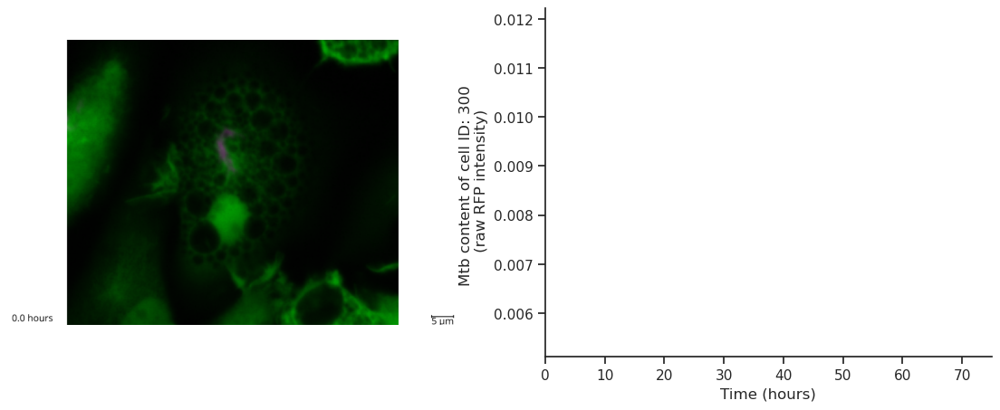

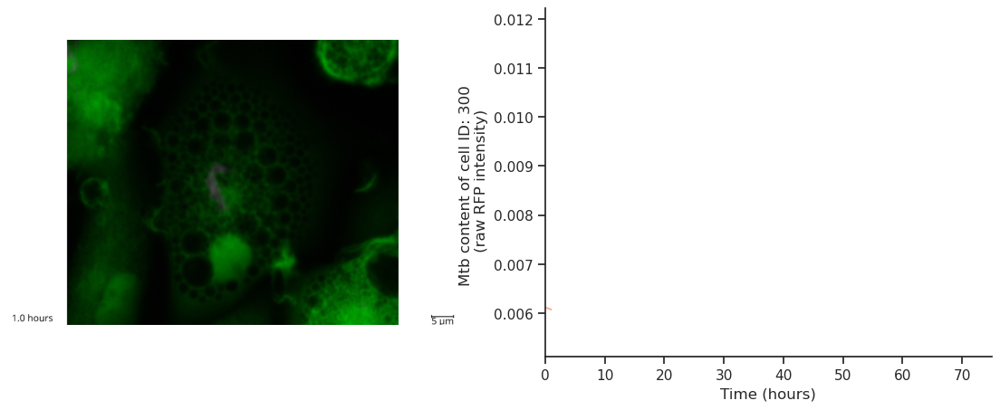

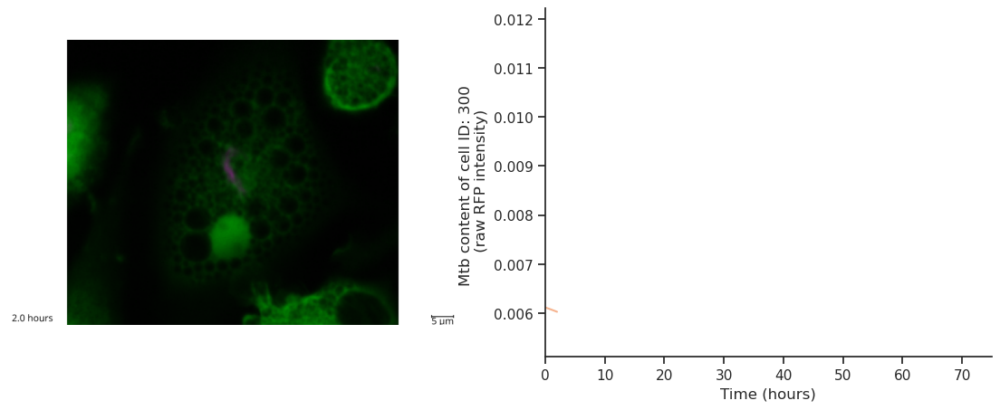

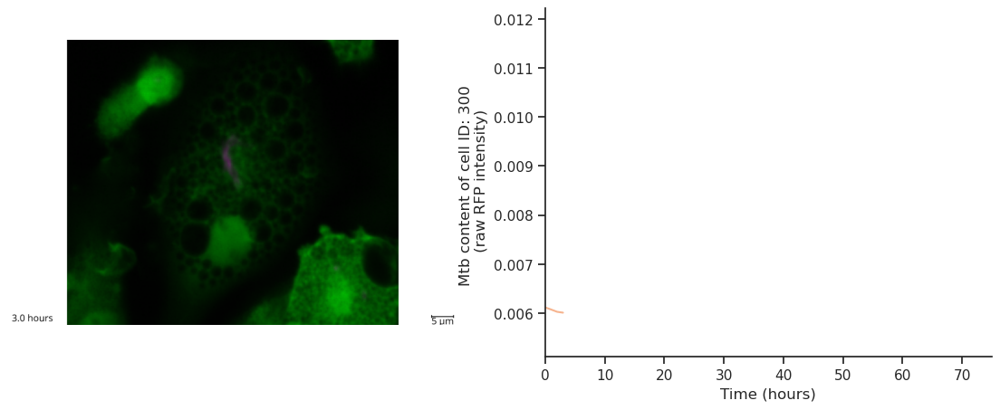

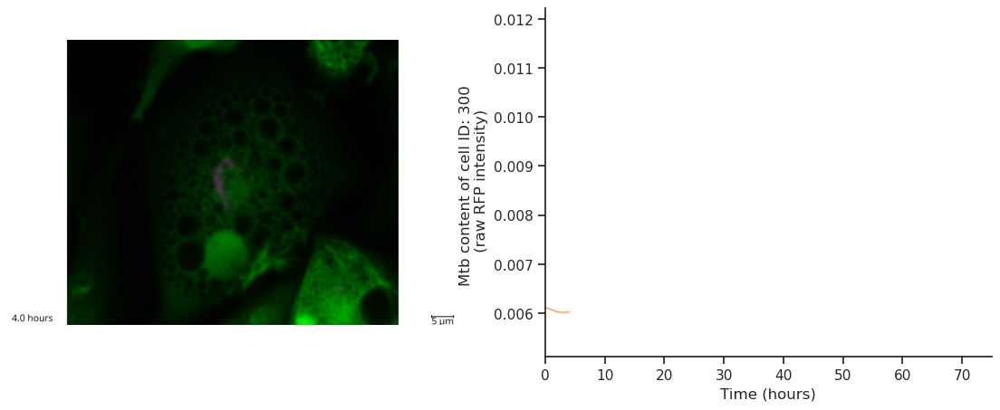

...

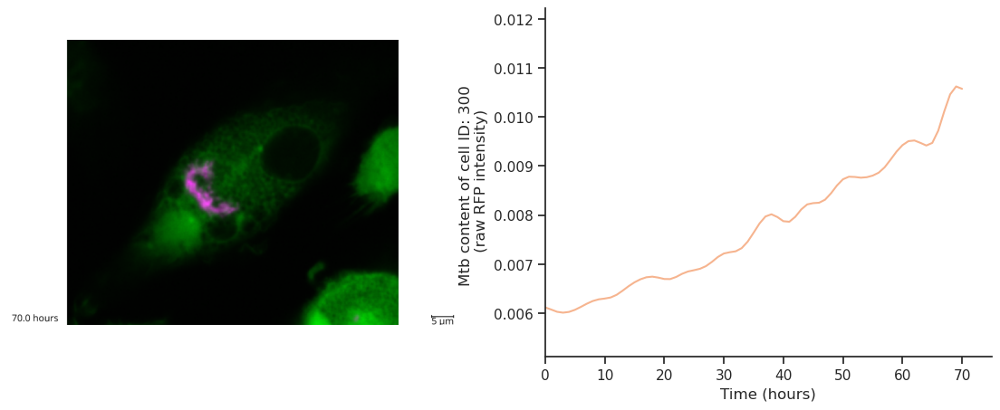

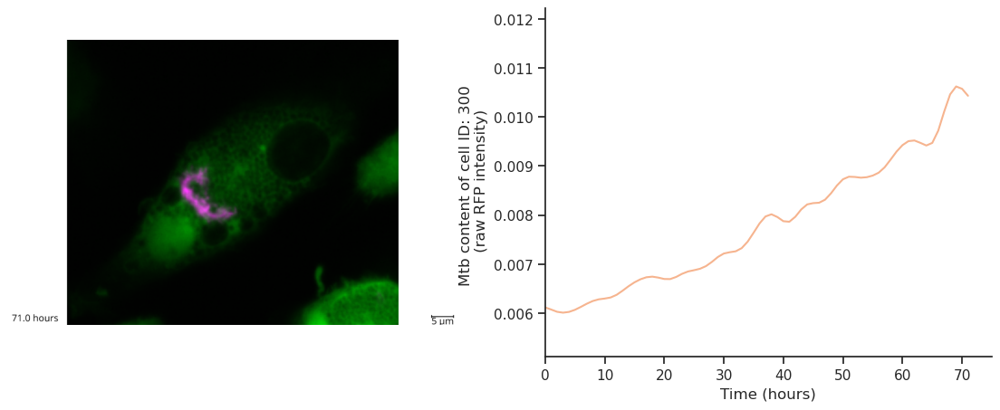

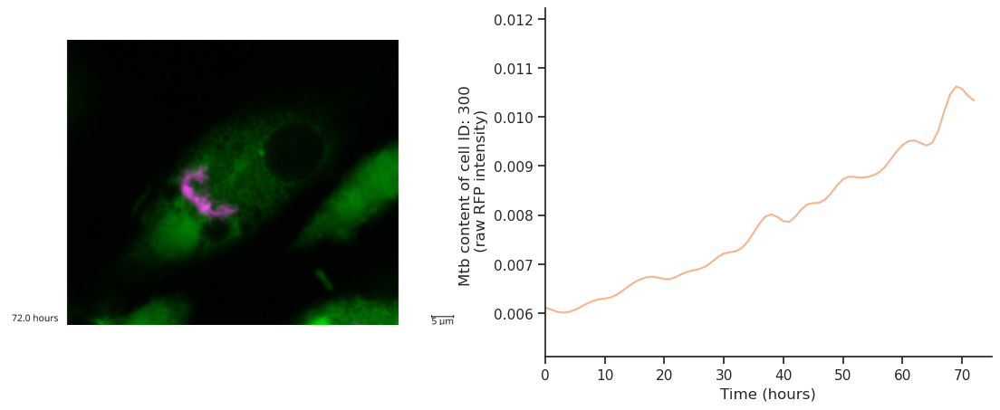

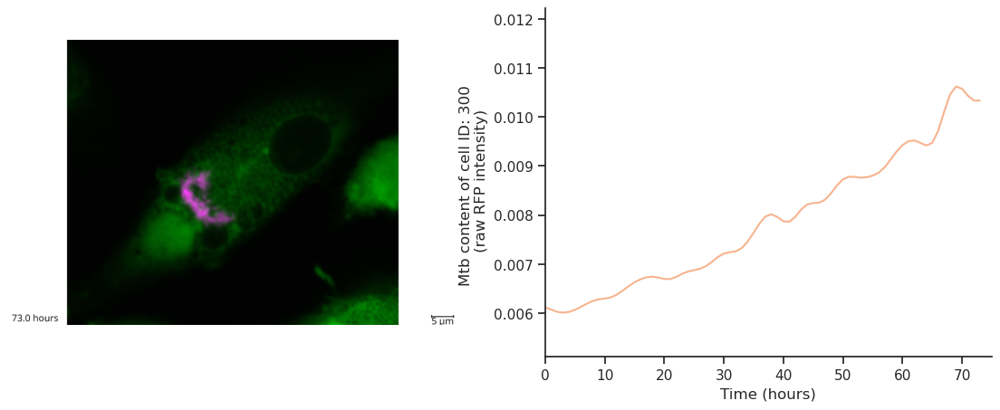

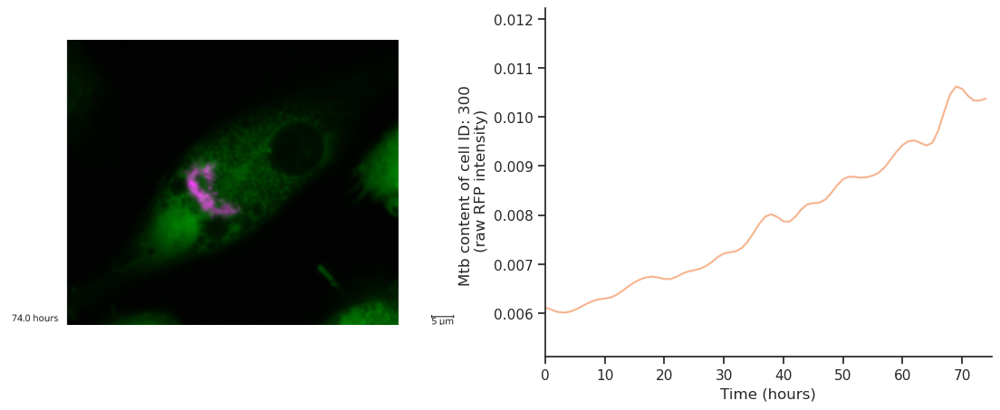

In [71]:
%%time
### create glimpse .mp4 filename
mp4_fn = os.path.join(basedir, f'glimpse_{ID}.mp4')
# Path(os.path.dirname(mp4_fn)).mkdir(parents=True, exist_ok=True)
### launch napari and animate images into mp4
viewer = napari.Viewer()
viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], scale = napari_scale)
viewer.theme = 'light'
viewer.scale_bar.visible = True
viewer.scale_bar.unit = 'm'
viewer.scale_bar.font_size = text_size
viewer.text_overlay.visible = True
viewer.text_overlay.color = 'black'
viewer.text_overlay.position = 'bottom_left'
viewer.text_overlay.font_size = text_size
viewer.dims.events.current_step.connect(update_slider)
### initiate animation viewer
animation = Animation(viewer)
viewer.update_console({'animation': animation})
# viewer.camera.center = (0, 0, 3024, 3024)
viewer.dims.current_step = (0, cam_coords[-2], cam_coords[-1])
viewer.camera.zoom = zoom#*0.85
animation.capture_keyframe(steps = 100)
viewer.dims.current_step = (74.0,  cam_coords[-2], cam_coords[-1])
animation.capture_keyframe(steps = 100)
### Save glimpse as MP4
print(f'Saving glimpse .mp4 ID: {acq_ID, ID}')
animation.animate(mp4_fn, 
                  canvas_only=True,
                  fps = 5,
                  quality = 9)
viewer.close()
### save glimpse as a series of images
print(f'Creating glimpse image sequence ID: {acq_ID, ID}')
### create output directory
glimpse_seq_basedir = os.path.join(basedir, f'{ID}_glimpse_seq')
Path(glimpse_seq_basedir).mkdir(parents=True, exist_ok=True)
### create napari instances and use to save glimpse frames with scale bar and time
viewer = napari.Viewer()
viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], scale = napari_scale)
viewer.theme = 'light'
viewer.scale_bar.visible = True
viewer.scale_bar.unit = 'm'
viewer.scale_bar.font_size = text_size
viewer.text_overlay.visible = True
viewer.text_overlay.color = 'black'
viewer.text_overlay.position = 'bottom_left'
viewer.text_overlay.font_size = text_size
viewer.dims.events.current_step.connect(update_slider)
### save image sequence
for t in tqdm(list(sc_df['Time (hours)']), desc = f'Saving glimpse image sequence ID: {acq_ID, ID}'):
    viewer.dims.current_step = (t, cam_coords[-2], cam_coords[-1])
    viewer.camera.zoom = zoom#*0.85
    glimpse_seq_fn = os.path.join(glimpse_seq_basedir, f'glimpse_{ID}_t_{t}.tiff')
    imsave(glimpse_seq_fn, viewer.screenshot())
viewer.close()
### create sequence of graph images
print(f'Creating graph image sequence ID: {acq_ID, ID}')
# create graph output folder
glimpse_graph_seq_basedir = os.path.join(basedir, f'{ID}_glimpse_graph_seq')
Path(glimpse_graph_seq_basedir).mkdir(parents = True, exist_ok = True)
### create graph by interpolating missing y values
y = sc_df['Intracellular Mtb content'].interpolate().values
x = sc_df['Time (hours)'].values
### smooth graph
y = gaussian_filter1d(y, sigma=1.5)
### iterate over time points
for n, row in tqdm(enumerate(sc_df.iterrows()), total = len(sc_df), 
                   desc = f'Saving graph image sequence ID: {acq_ID, ID}'):
    ### select portion of data to plot up to current time point iteration
    plot_x = sc_df['Time (hours)'].iloc[0:n+1].values
    plot_y = y[0:n+1]
    ### get time ID for labelling purposes
    t = row[1]['Time (hours)']     
    ### initiate plot with two components
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14,5), gridspec_kw={'width_ratios': [1, 1]})
    ### label fn with time point
    glimpse_seq_fn = os.path.join(glimpse_seq_basedir, f'glimpse_{ID}_t_{t}.tiff')
    ### load glimpse image from this timepoint
    glimpse_img = imread(glimpse_seq_fn)
    ### add glimpse frame to first part of subplot
    ax1.imshow(glimpse_img)
    ### turn axis off for glimpse
    ax1.axis('off')
    ### plot portion of graph 
    ax2.plot(plot_x, plot_y,)# c = palette[1])
    ### set aspect
    # ax2.set_aspect(75/y.max())
    ### label graph properly 
    ax2.set(xlabel = 'Time (hours)', 
            ylabel = f'Mtb content of cell ID: {ID} \n (raw RFP intensity)', 
            ylim=(y.min()*0.85,y.max()*1.15), 
            xlim = (0,75))
    ### despine plot
    sns.despine()
    ### new fn for joint glimpse plot
    new_graph_fn = os.path.join(glimpse_graph_seq_basedir, f'glimpse_graph_{ID}_t_{t}.tiff')
    plt.savefig(new_graph_fn, bbox_inches = 'tight', dpi = 314)

## Compile single frame graphs into stack for animation
print(f'Creating graph and glimpse image sequence ID: {acq_ID, ID}')
plots = list()
for fn in natsorted(glob.glob(os.path.join(glimpse_graph_seq_basedir, '*.tiff'))):
    plot = imread(fn)
    plots.append(plot)
plots = np.stack(plots, axis = 0)
### create final fn
glimpse_graph_fn = os.path.join(basedir, f'glimpse_graph_{ID}.mp4')
### initiate napari session for animation
viewer = napari.Viewer()
viewer.add_image(plots)#, channel_axis = 0, colormap= ['green', 'magenta'], scale = scale
viewer.theme = 'light'
# viewer.scale_bar.visible = True
# viewer.scale_bar.unit = 'm'
# viewer.scale_bar.font_size = text_size
# viewer.text_overlay.visible = True
# viewer.text_overlay.color = 'black'
# viewer.text_overlay.position = 'bottom_left'
# viewer.text_overlay.font_size = text_size
# viewer.dims.events.current_step.connect(update_slider)
animation = Animation(viewer)
viewer.update_console({'animation': animation})
# # viewer.camera.center = (0, 0, 3024, 3024)
viewer.dims.current_step = (0, cam_coords[-2], cam_coords[-1])
# viewer.camera.zoom = 0.23
animation.capture_keyframe(steps = 100)
viewer.dims.current_step = (75.0,  cam_coords[-2], cam_coords[-1])
animation.capture_keyframe(steps = 100)
print(f'Saving graph and glimpse animation ID: {acq_ID, ID}')
animation.animate(glimpse_graph_fn, 
                  canvas_only=True,
                  fps = 5,
                  quality = 9)
viewer.close()
# plt.clf()

# Iteratively generate glimpses

In [ ]:
for assay_info in tqdm(assay_layout.iterrows(), 
                       total = len(assay_layout), 
                       desc = 'Iterating over different assays, generating two extreme glimpses per assay'):
    ### pull acq ID from assay info
    acq_ID = assay_info[0]

    ### iterate over different experiments
    selected_expt_df = df[(df['Acquisition ID'] == acq_ID)]

    ### get extreme cells
    extreme_cases = pd.concat([selected_expt_df[(selected_expt_df['Mean Mtb content'] == np.max(selected_expt_df['Mean Mtb content']))],
                               selected_expt_df[(selected_expt_df['Mean Mtb content'] == np.min(selected_expt_df['Mean Mtb content']))]])
    
    ### iterate over two extreme cases in either
    for ID in tqdm(extreme_cases['Cell ID'].unique(), 
                   desc = f'Iterating over two extreme cells in acquisition ID:{acq_ID}'):
        ### isolate a single cell ID from df of interesting cells
        sc_df = extreme_cases[extreme_cases['Cell ID']==ID]
        # ### get cell ID
        # ID = sc_df['Cell ID'].iloc[0]
        # ### get acquisition ID 
        # acq_ID = sc_df['Acquisition ID'].iloc[0]
        ### use acq ID to pre load correct images
        row, column = acq_ID
        images = tile.compile_mosaic(
                                     image_dir, 
                                     metadata, 
                                     row, 
                                     column, 
                                     set_plane = 'sum_proj',
                                     ).astype(np.uint16)
        ### create base dirname
        basedir = f'/home/dayn/Videos/tb_mp4s/glimpses/pierre_data/{acq_ID}/{ID}/'
        Path(os.path.dirname(basedir)).mkdir(parents=True, exist_ok=True)
        ### make glimpse stack of images
        print(f'Creating glimpse ID: {acq_ID, ID}')
        ### create empty list for stack of images
        glimpse_stack = list()
        ### iterate over time points from single cell 
        for row in tqdm(sc_df.iterrows(), total = len(sc_df), desc = f'Creating glimpse ID: {acq_ID, ID}'):
            ### get coords
            t, x, y = row[1]['Time (hours)'], row[1]['y'], row[1]['x']
            ### select proper frame
            frame = images[t,...]
            ### scale as tracking was done on rescaled images
            x1, y1 = x*scale, y*scale
            ### create window for glimpse
            x1, x2, y1, y2 = x1, x1+size, y1, y1+size
            ### add padding for boundary cases
            frame = da.pad(frame, [(0, 0), (size/2, size/2), (size/2, size/2)], 'constant', constant_values = 0) 
            ### create glimpse image by cropping original image
            glimpse = frame[..., int(x1): int(x2), int(y1): int(y2)]
            ### append to glimpse stack
            glimpse_stack.append(glimpse)
        ### stack glimpse together
        glimpse_stack = np.stack(glimpse_stack, axis = 1)
        ### load glimpse into memory
        print(f'Loading glimpse stack {acq_ID, ID} into memory (can take several minutes)')
        glimpse_stack = glimpse_stack.compute().compute()
        ### Check glimpse with labels
        viewer = napari.Viewer()
        viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], scale = napari_scale)
        viewer.theme = 'light'
        viewer.scale_bar.visible = True
        viewer.scale_bar.unit = 'm'
        viewer.scale_bar.font_size = text_size
        viewer.text_overlay.visible = True
        viewer.text_overlay.color = 'black'
        viewer.text_overlay.position = 'bottom_left'
        viewer.text_overlay.font_size = text_size
        viewer.dims.events.current_step.connect(update_slider)
        zoom = viewer.camera.zoom
        cam_coords = viewer.camera.center

        ### create glimpse .mp4 filename
        mp4_fn = os.path.join(basedir, f'glimpse_{ID}.mp4')
        # Path(os.path.dirname(mp4_fn)).mkdir(parents=True, exist_ok=True)
        ### launch napari and animate images into mp4
        viewer = napari.Viewer()
        viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], scale = napari_scale)
        viewer.theme = 'light'
        viewer.scale_bar.visible = True
        viewer.scale_bar.unit = 'm'
        viewer.scale_bar.font_size = text_size
        viewer.text_overlay.visible = True
        viewer.text_overlay.color = 'black'
        viewer.text_overlay.position = 'bottom_left'
        viewer.text_overlay.font_size = text_size
        viewer.dims.events.current_step.connect(update_slider)
        ### initiate animation viewer
        animation = Animation(viewer)
        viewer.update_console({'animation': animation})
        # viewer.camera.center = (0, 0, 3024, 3024)
        viewer.dims.current_step = (0, cam_coords[-2], cam_coords[-1])
        viewer.camera.zoom = zoom*0.85
        animation.capture_keyframe(steps = 100)
        viewer.dims.current_step = (74.0,  cam_coords[-2], cam_coords[-1])
        animation.capture_keyframe(steps = 100)
        ### Save glimpse as MP4
        print(f'Saving glimpse .mp4 ID: {acq_ID, ID}')
        animation.animate(mp4_fn, 
                          canvas_only=True,
                          fps = 5,
                          quality = 9)
        viewer.close()
        ### save glimpse as a series of images
        print(f'Creating glimpse image sequence ID: {acq_ID, ID}')
        ### create output directory
        glimpse_seq_basedir = os.path.join(basedir, f'{ID}_glimpse_seq')
        Path(glimpse_seq_basedir).mkdir(parents=True, exist_ok=True)
        ### create napari instances and use to save glimpse frames with scale bar and time
        viewer = napari.Viewer()
        viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], scale = napari_scale)
        viewer.theme = 'light'
        viewer.scale_bar.visible = True
        viewer.scale_bar.unit = 'm'
        viewer.scale_bar.font_size = text_size
        viewer.text_overlay.visible = True
        viewer.text_overlay.color = 'black'
        viewer.text_overlay.position = 'bottom_left'
        viewer.text_overlay.font_size = text_size
        viewer.dims.events.current_step.connect(update_slider)
        ### save image sequence
        for t in tqdm(list(sc_df['Time (hours)']), desc = f'Saving glimpse image sequence ID: {acq_ID, ID}'):
            viewer.dims.current_step = (t, cam_coords[-2], cam_coords[-1])
            viewer.camera.zoom = zoom*0.85
            glimpse_seq_fn = os.path.join(glimpse_seq_basedir, f'glimpse_{ID}_t_{t}.tiff')
            imsave(glimpse_seq_fn, viewer.screenshot())
        viewer.close()
        ### create sequence of graph images
        print(f'Creating graph image sequence ID: {acq_ID, ID}')
        # create graph output folder
        glimpse_graph_seq_basedir = os.path.join(basedir, f'{ID}_glimpse_graph_seq')
        Path(glimpse_graph_seq_basedir).mkdir(parents = True, exist_ok = True)
        ### create graph by interpolating missing y values
        y = sc_df['Intracellular Mtb content'].interpolate().values
        x = sc_df['Time (hours)'].values
        ### smooth graph
        y = gaussian_filter1d(y, sigma=1.5)
        ### iterate over time points
        for n, row in tqdm(enumerate(sc_df.iterrows()), total = len(sc_df), 
                           desc = f'Saving graph image sequence ID: {acq_ID, ID}'):
            ### select portion of data to plot up to current time point iteration
            plot_x = sc_df['Time (hours)'].iloc[0:n+1].values
            plot_y = y[0:n+1]
            ### get time ID for labelling purposes
            t = row[1]['Time (hours)']     
            ### initiate plot with two components
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14,5), gridspec_kw={'width_ratios': [1, 1]})
            ### label fn with time point
            glimpse_seq_fn = os.path.join(glimpse_seq_basedir, f'glimpse_{ID}_t_{t}.tiff')
            ### load glimpse image from this timepoint
            glimpse_img = imread(glimpse_seq_fn)
            ### add glimpse frame to first part of subplot
            ax1.imshow(glimpse_img)
            ### turn axis off for glimpse
            ax1.axis('off')
            ### plot portion of graph 
            ax2.plot(plot_x, plot_y,)# c = palette[1])
            ### set aspect
            # ax2.set_aspect(75/y.max())
            ### label graph properly 
            ax2.set(xlabel = 'Time (hours)', 
                    ylabel = f'Mtb content of cell ID: {ID} \n (raw RFP intensity)', 
                    ylim=(y.min()*0.85,y.max()*1.15), 
                    xlim = (0,75))
            ### despine plot
            sns.despine()
            ### new fn for joint glimpse plot
            new_graph_fn = os.path.join(glimpse_graph_seq_basedir, f'glimpse_graph_{ID}_t_{t}.tiff')
            plt.savefig(new_graph_fn, bbox_inches = 'tight', dpi = 314)

        ## Compile single frame graphs into stack for animation
        print(f'Creating graph and glimpse image sequence ID: {acq_ID, ID}')
        plots = list()
        for fn in natsorted(glob.glob(os.path.join(glimpse_graph_seq_basedir, '*.tiff'))):
            plot = imread(fn)
            plots.append(plot)
        plots = np.stack(plots, axis = 0)
        ### create final fn
        glimpse_graph_fn = os.path.join(basedir, f'glimpse_graph_{ID}.mp4')
        ### initiate napari session for animation
        viewer = napari.Viewer()
        viewer.add_image(plots)#, channel_axis = 0, colormap= ['green', 'magenta'], scale = scale
        viewer.theme = 'light'
        # viewer.scale_bar.visible = True
        # viewer.scale_bar.unit = 'm'
        # viewer.scale_bar.font_size = text_size
        # viewer.text_overlay.visible = True
        # viewer.text_overlay.color = 'black'
        # viewer.text_overlay.position = 'bottom_left'
        # viewer.text_overlay.font_size = text_size
        # viewer.dims.events.current_step.connect(update_slider)
        animation = Animation(viewer)
        viewer.update_console({'animation': animation})
        # # viewer.camera.center = (0, 0, 3024, 3024)
        viewer.dims.current_step = (0, cam_coords[-2], cam_coords[-1])
        viewer.camera.zoom = 0.23
        animation.capture_keyframe(steps = 100)
        viewer.dims.current_step = (75.0,  cam_coords[-2], cam_coords[-1])
        animation.capture_keyframe(steps = 100)
        print(f'Saving graph and glimpse animation ID: {acq_ID, ID}')
        animation.animate(glimpse_graph_fn, 
                          canvas_only=True,
                          fps = 5,
                          quality = 9)
        viewer.close()
        plt.clf()

Iterating over different assays, generating two extreme glimpses per assay:   0%|          | 0/24 [00:00<?, ?i…

Iterating over two extreme cells in acquisition ID:(3, 4):   0%|          | 0/2 [00:00<?, ?it/s]

Creating glimpse ID: ((3, 4), 413)


Creating glimpse ID: ((3, 4), 413):   0%|          | 0/75 [00:00<?, ?it/s]

/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/dask/array/core.py:1744: PerformanceWarning: Increasing number of chunks by factor of 16
  return da_func(*args, **kwargs)


Loading glimpse stack ((3, 4), 413) into memory (can take several minutes)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving glimpse .mp4 ID: ((3, 4), 413)
Rendering frames...




  0%|                                                   | 0/101 [00:00<?, ?it/s]06-Mar-23 13:41:22 - imageio_ffmpeg - WARNING  - IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (798, 742) to (800, 752) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


  1%|▍                                          | 1/101 [00:00<00:59,  1.69it/s][swscaler @ 0x5cc1000] Warning: data is not aligned! This can lead to a speed loss


  3%|█▎                                         | 3/101 [00:00<00:18,  5.21it/s]

  6%|██▌                                        | 6/101 [00:00<00:09,  9.60it/s]

  8%|███▍                                       | 8/101 [00:00<00:08, 11.31it/s]

 10%|████▏                                     | 10/101 [00:01<00:06, 13.23it/s]

 12%|████▉                                     | 12/10

Creating glimpse image sequence ID: ((3, 4), 413)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving glimpse image sequence ID: ((3, 4), 413):   0%|          | 0/75 [00:00<?, ?it/s]

Creating graph image sequence ID: ((3, 4), 413)


Saving graph image sequence ID: ((3, 4), 413):   0%|          | 0/75 [00:00<?, ?it/s]

Creating graph and glimpse image sequence ID: ((3, 4), 413)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving graph and glimpse animation ID: ((3, 4), 413)
Rendering frames...




  0%|                                                   | 0/101 [00:00<?, ?it/s]06-Mar-23 13:42:08 - imageio_ffmpeg - WARNING  - IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (798, 742) to (800, 752) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


  1%|▍                                          | 1/101 [00:00<01:04,  1.54it/s][swscaler @ 0x574b000] Warning: data is not aligned! This can lead to a speed loss


  3%|█▎                                         | 3/101 [00:00<00:21,  4.57it/s]

  6%|██▌                                        | 6/101 [00:00<00:10,  8.96it/s]

  9%|███▊                                       | 9/101 [00:01<00:06, 13.31it/s]

 12%|████▉                                     | 12/101 [00:01<00:05, 16.14it/s]

 15%|██████▏                                   | 15/10

Creating glimpse ID: ((3, 4), 452)


Creating glimpse ID: ((3, 4), 452):   0%|          | 0/75 [00:00<?, ?it/s]

/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/dask/array/core.py:1744: PerformanceWarning: Increasing number of chunks by factor of 376
  return da_func(*args, **kwargs)


Loading glimpse stack ((3, 4), 452) into memory (can take several minutes)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving glimpse .mp4 ID: ((3, 4), 452)
Rendering frames...




  0%|                                                   | 0/101 [00:00<?, ?it/s]06-Mar-23 13:49:06 - imageio_ffmpeg - WARNING  - IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (798, 742) to (800, 752) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


  1%|▍                                          | 1/101 [00:00<01:04,  1.56it/s][swscaler @ 0x70a9000] Warning: data is not aligned! This can lead to a speed loss


  3%|█▎                                         | 3/101 [00:00<00:20,  4.87it/s]

  6%|██▌                                        | 6/101 [00:00<00:10,  8.99it/s]

  9%|███▊                                       | 9/101 [00:01<00:07, 12.99it/s]

 11%|████▌                                     | 11/101 [00:01<00:06, 14.45it/s]

 13%|█████▍                                    | 13/10

Creating glimpse image sequence ID: ((3, 4), 452)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving glimpse image sequence ID: ((3, 4), 452):   0%|          | 0/75 [00:00<?, ?it/s]

Creating graph image sequence ID: ((3, 4), 452)


Saving graph image sequence ID: ((3, 4), 452):   0%|          | 0/75 [00:00<?, ?it/s]

Creating graph and glimpse image sequence ID: ((3, 4), 452)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving graph and glimpse animation ID: ((3, 4), 452)
Rendering frames...




  0%|                                                   | 0/101 [00:00<?, ?it/s]06-Mar-23 13:49:52 - imageio_ffmpeg - WARNING  - IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (798, 742) to (800, 752) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


  1%|▍                                          | 1/101 [00:00<01:03,  1.58it/s][swscaler @ 0x67a0000] Warning: data is not aligned! This can lead to a speed loss


  4%|█▋                                         | 4/101 [00:00<00:15,  6.33it/s]

  8%|███▍                                       | 8/101 [00:00<00:07, 12.06it/s]

 11%|████▌                                     | 11/101 [00:01<00:05, 15.45it/s]

 14%|█████▊                                    | 14/101 [00:01<00:04, 17.67it/s]

 17%|███████                                   | 17/10

Iterating over two extreme cells in acquisition ID:(3, 5):   0%|          | 0/2 [00:00<?, ?it/s]

Creating glimpse ID: ((3, 5), 232)


Creating glimpse ID: ((3, 5), 232):   0%|          | 0/75 [00:00<?, ?it/s]

Loading glimpse stack ((3, 5), 232) into memory (can take several minutes)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving glimpse .mp4 ID: ((3, 5), 232)
Rendering frames...




  0%|                                                   | 0/101 [00:00<?, ?it/s]06-Mar-23 13:51:43 - imageio_ffmpeg - WARNING  - IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (798, 742) to (800, 752) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


  1%|▍                                          | 1/101 [00:00<01:02,  1.61it/s][swscaler @ 0x5a1d000] Warning: data is not aligned! This can lead to a speed loss


  3%|█▎                                         | 3/101 [00:00<00:20,  4.84it/s]

  6%|██▌                                        | 6/101 [00:00<00:09,  9.52it/s]

 10%|████▏                                     | 10/101 [00:00<00:06, 15.15it/s]

 14%|█████▊                                    | 14/101 [00:01<00:04, 19.51it/s]

 18%|███████▍                                  | 18/10

Creating glimpse image sequence ID: ((3, 5), 232)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving glimpse image sequence ID: ((3, 5), 232):   0%|          | 0/75 [00:00<?, ?it/s]

Creating graph image sequence ID: ((3, 5), 232)


Saving graph image sequence ID: ((3, 5), 232):   0%|          | 0/75 [00:00<?, ?it/s]

Creating graph and glimpse image sequence ID: ((3, 5), 232)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving graph and glimpse animation ID: ((3, 5), 232)
Rendering frames...




  0%|                                                   | 0/101 [00:00<?, ?it/s]06-Mar-23 13:52:31 - imageio_ffmpeg - WARNING  - IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (798, 742) to (800, 752) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


  1%|▍                                          | 1/101 [00:00<01:05,  1.52it/s][swscaler @ 0x7143000] Warning: data is not aligned! This can lead to a speed loss


  3%|█▎                                         | 3/101 [00:00<00:20,  4.78it/s]

  6%|██▌                                        | 6/101 [00:00<00:09,  9.72it/s]

  9%|███▊                                       | 9/101 [00:00<00:06, 14.10it/s]

 12%|████▉                                     | 12/101 [00:01<00:05, 16.26it/s]

 15%|██████▏                                   | 15/10

Creating glimpse ID: ((3, 5), 304)


Creating glimpse ID: ((3, 5), 304):   0%|          | 0/75 [00:00<?, ?it/s]

Loading glimpse stack ((3, 5), 304) into memory (can take several minutes)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/dask/array/core.py:1744: PerformanceWarning: Increasing number of chunks by factor of 33
  return da_func(*args, **kwargs)
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  se

Saving glimpse .mp4 ID: ((3, 5), 304)
Rendering frames...




  0%|                                                   | 0/101 [00:00<?, ?it/s]06-Mar-23 13:54:47 - imageio_ffmpeg - WARNING  - IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (798, 742) to (800, 752) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


  1%|▍                                          | 1/101 [00:00<01:02,  1.60it/s][swscaler @ 0x6272000] Warning: data is not aligned! This can lead to a speed loss


  4%|█▋                                         | 4/101 [00:00<00:15,  6.17it/s]

  7%|██▉                                        | 7/101 [00:00<00:08, 10.54it/s]

 10%|████▏                                     | 10/101 [00:01<00:06, 14.58it/s]

 13%|█████▍                                    | 13/101 [00:01<00:05, 16.55it/s]

 16%|██████▋                                   | 16/10

Creating glimpse image sequence ID: ((3, 5), 304)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving glimpse image sequence ID: ((3, 5), 304):   0%|          | 0/75 [00:00<?, ?it/s]

Creating graph image sequence ID: ((3, 5), 304)


Saving graph image sequence ID: ((3, 5), 304):   0%|          | 0/75 [00:00<?, ?it/s]

Creating graph and glimpse image sequence ID: ((3, 5), 304)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving graph and glimpse animation ID: ((3, 5), 304)
Rendering frames...




  0%|                                                   | 0/101 [00:00<?, ?it/s]06-Mar-23 13:55:34 - imageio_ffmpeg - WARNING  - IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (798, 742) to (800, 752) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


  1%|▍                                          | 1/101 [00:00<01:04,  1.54it/s][swscaler @ 0x5d98000] Warning: data is not aligned! This can lead to a speed loss


  4%|█▋                                         | 4/101 [00:00<00:16,  5.96it/s]

  7%|██▉                                        | 7/101 [00:00<00:09,  9.80it/s]

 10%|████▏                                     | 10/101 [00:01<00:06, 13.74it/s]

 14%|█████▊                                    | 14/101 [00:01<00:04, 17.88it/s]

 17%|███████                                   | 17/10

Iterating over two extreme cells in acquisition ID:(3, 6):   0%|          | 0/2 [00:00<?, ?it/s]

Creating glimpse ID: ((3, 6), 72)


Creating glimpse ID: ((3, 6), 72):   0%|          | 0/75 [00:00<?, ?it/s]

Loading glimpse stack ((3, 6), 72) into memory (can take several minutes)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/dask/array/core.py:1744: PerformanceWarning: Increasing number of chunks by factor of 29
  return da_func(*args, **kwargs)
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  se

Saving glimpse .mp4 ID: ((3, 6), 72)
Rendering frames...




  0%|                                                   | 0/101 [00:00<?, ?it/s]06-Mar-23 13:59:12 - imageio_ffmpeg - WARNING  - IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (798, 742) to (800, 752) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


  1%|▍                                          | 1/101 [00:00<00:58,  1.70it/s][swscaler @ 0x6d0a180] Warning: data is not aligned! This can lead to a speed loss


  4%|█▋                                         | 4/101 [00:00<00:14,  6.72it/s]

  7%|██▉                                        | 7/101 [00:00<00:08, 11.34it/s]

 10%|████▏                                     | 10/101 [00:00<00:06, 14.28it/s]

 13%|█████▍                                    | 13/101 [00:01<00:05, 16.50it/s]

 16%|██████▋                                   | 16/10

Creating glimpse image sequence ID: ((3, 6), 72)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving glimpse image sequence ID: ((3, 6), 72):   0%|          | 0/75 [00:00<?, ?it/s]

Creating graph image sequence ID: ((3, 6), 72)


Saving graph image sequence ID: ((3, 6), 72):   0%|          | 0/75 [00:00<?, ?it/s]

Creating graph and glimpse image sequence ID: ((3, 6), 72)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving graph and glimpse animation ID: ((3, 6), 72)
Rendering frames...




  0%|                                                   | 0/101 [00:00<?, ?it/s]06-Mar-23 13:59:56 - imageio_ffmpeg - WARNING  - IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (798, 742) to (800, 752) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


  1%|▍                                          | 1/101 [00:00<01:03,  1.58it/s][swscaler @ 0x5cb9000] Warning: data is not aligned! This can lead to a speed loss


  4%|█▋                                         | 4/101 [00:00<00:14,  6.51it/s]

  8%|███▍                                       | 8/101 [00:00<00:07, 12.63it/s]

 11%|████▌                                     | 11/101 [00:01<00:05, 15.50it/s]

 14%|█████▊                                    | 14/101 [00:01<00:04, 18.54it/s]

 18%|███████▍                                  | 18/10

Creating glimpse ID: ((3, 6), 159)


Creating glimpse ID: ((3, 6), 159):   0%|          | 0/75 [00:00<?, ?it/s]

Loading glimpse stack ((3, 6), 159) into memory (can take several minutes)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/dask/array/core.py:1744: PerformanceWarning: Increasing number of chunks by factor of 18
  return da_func(*args, **kwargs)
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)
/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  se

Saving glimpse .mp4 ID: ((3, 6), 159)
Rendering frames...




  0%|                                                   | 0/101 [00:00<?, ?it/s]06-Mar-23 14:02:48 - imageio_ffmpeg - WARNING  - IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (798, 742) to (800, 752) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


  1%|▍                                          | 1/101 [00:00<01:03,  1.57it/s][swscaler @ 0x648e000] Warning: data is not aligned! This can lead to a speed loss


  3%|█▎                                         | 3/101 [00:00<00:20,  4.82it/s]

  6%|██▌                                        | 6/101 [00:00<00:10,  9.38it/s]

 10%|████▏                                     | 10/101 [00:01<00:06, 14.84it/s]

 13%|█████▍                                    | 13/101 [00:01<00:05, 17.12it/s]

 16%|██████▋                                   | 16/10

Creating glimpse image sequence ID: ((3, 6), 159)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving glimpse image sequence ID: ((3, 6), 159):   0%|          | 0/75 [00:00<?, ?it/s]

Creating graph image sequence ID: ((3, 6), 159)


Saving graph image sequence ID: ((3, 6), 159):   0%|          | 0/75 [00:00<?, ?it/s]

Creating graph and glimpse image sequence ID: ((3, 6), 159)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Saving graph and glimpse animation ID: ((3, 6), 159)
Rendering frames...




  0%|                                                   | 0/101 [00:00<?, ?it/s]06-Mar-23 14:03:37 - imageio_ffmpeg - WARNING  - IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (798, 742) to (800, 752) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


  1%|▍                                          | 1/101 [00:00<01:02,  1.60it/s][swscaler @ 0x71db000] Warning: data is not aligned! This can lead to a speed loss


  4%|█▋                                         | 4/101 [00:00<00:14,  6.57it/s]

  7%|██▉                                        | 7/101 [00:00<00:08, 11.25it/s]

 10%|████▏                                     | 10/101 [00:00<00:06, 14.46it/s]

 13%|█████▍                                    | 13/101 [00:01<00:05, 17.03it/s]

 16%|██████▋                                   | 16/10

Iterating over two extreme cells in acquisition ID:(3, 7):   0%|          | 0/2 [00:00<?, ?it/s]

Creating glimpse ID: ((3, 7), 45)


Creating glimpse ID: ((3, 7), 45):   0%|          | 0/75 [00:00<?, ?it/s]

Loading glimpse stack ((3, 7), 45) into memory (can take several minutes)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/dask/array/core.py:1744: PerformanceWarning: Increasing number of chunks by factor of 25
  return da_func(*args, **kwargs)
